In [2]:
library(sf)

# Lee el archivo .shp
shapefile_path <- "/Users/jeronimo/Desktop/Jero/VS_Code/VI/atlas_de_riesgo_inundaciones/atlas_de_riesgo_inundaciones.shp"
gdf <- st_read(shapefile_path)

# Muestra las primeras filas del GeoDataFrame
print(head(gdf))

Reading layer `atlas_de_riesgo_inundaciones' from data source 
  `/Users/jeronimo/Desktop/Jero/VS_Code/VI/atlas_de_riesgo_inundaciones/atlas_de_riesgo_inundaciones.shp' 
  using driver `ESRI Shapefile'
Simple feature collection with 4908 features and 19 fields
Geometry type: POLYGON
Dimension:     XY
Bounding box:  xmin: -99.36492 ymin: 19.04824 xmax: -98.9403 ymax: 19.59276
Geodetic CRS:  WGS 84
Simple feature collection with 6 features and 19 fields
Geometry type: POLYGON
Dimension:     XY
Bounding box:  xmin: -99.14704 ymin: 19.21883 xmax: -98.99091 ymax: 19.39266
Geodetic CRS:  WGS 84
  X_id  id                      g_pnt_2
1    1  35 19.2422518066,-99.0731823535
2    2  56 19.2236128042,-99.1083418839
3    3  32 19.3809650541,-99.1373113251
4    4  45    19.2603567,-99.0628861422
5    5  31  19.3905750675,-99.144452701
6    6 305 19.2276041044,-98.9941234328
                                                                                                                            

In [3]:
colnames(gdf)

[1] "X_id"     "id"       "g_pnt_2"  "geo_shp"  "fenomen"  "taxonom" 
 [7] "r_p_v_e"  "intnsdd"  "descrpc"  "fuente"   "cvegeo"   "alcaldi" 
[13] "entidad"  "area_m2"  "perim_m"  "perd_rt"  "intens_n" "intns_nm"
[19] "int2"     "geometry"

# Por poligonos

In [4]:
library(leaflet)
library(sf)
library(grDevices)

# Asumiendo que gdf ya es un objeto sf
# Si no, convertirlo a sf usando st_as_sf
# gdf <- st_as_sf(gdf)

# Definir la paleta de colores personalizada de azul claro a azul oscuro
pal <- colorFactor(
  palette = colorRampPalette(c("#ADD8E6", "#00008B"))(9),  # Azul claro a azul oscuro
  domain = gdf$intnsdd
)

# Crear el mapa Leaflet
leaflet(data = gdf) %>%
  addProviderTiles("CartoDB.Positron") %>%  # Añadir un mapa base
  addPolygons(
    fillColor = ~pal(intnsdd),  # Color basado en el campo 'intnsdd'
    weight = 1,                 # Grosor del borde
    opacity = 1,                # Opacidad del borde
    color = ~pal(intnsdd),      # Color del borde
    fillOpacity = 0.7,          # Opacidad del relleno del polígono
    label = ~alcaldi            # Mostrar solo el nombre de la alcaldía al pasar el cursor
  ) %>%
  addLegend(
    pal = pal,
    values = ~intnsdd,
    title = "Nivel de Intensidad",
    position = "bottomright"
  )

HTML widgets cannot be represented in plain text (need html)

# Por alcaldias


In [1]:
library(sf)
library(dplyr)
library(leaflet)
library(grDevices)

# Cargar los datos
shapefile_path <- "/Users/jeronimo/Desktop/Jero/VS_Code/VI/atlas_de_riesgo_inundaciones/atlas_de_riesgo_inundaciones.shp"
gdf <- st_read(shapefile_path)

# Agrupar por alcaldía y calcular el nivel promedio de riesgo de inundación
gdf_summary <- gdf %>%
  group_by(alcaldi) %>%
  summarise(
    avg_intensity = mean(as.numeric(factor(intnsdd, levels = c("Muy Bajo", "Bajo", "Medio", "Alto", "Muy Alto"))), na.rm = TRUE),
    geometry = st_combine(geometry),  # Combina geometrías de la misma alcaldía
    .groups = "drop"
  ) %>%
  st_cast("POLYGON") %>%  # Asegura que las geometrías son polígonos
  st_as_sf()

# Definir la paleta de colores personalizada de azul claro a azul oscuro
pal <- colorNumeric(
  palette = colorRampPalette(c("#ADD8E6", "#00008B"))(9),  # Azul claro a azul oscuro
  domain = gdf_summary$avg_intensity
)

# Crear el mapa interactivo
leaflet(gdf_summary) %>%
  addProviderTiles("CartoDB.Positron") %>%  # Añadir un mapa base
  addPolygons(
    fillColor = ~pal(avg_intensity),
    color = ~pal(avg_intensity),  # Color del borde
    weight = 1,                   # Grosor del borde
    opacity = 1,                  # Opacidad del borde
    fillOpacity = 0.7,            # Opacidad del relleno del polígono
    highlightOptions = highlightOptions(
      weight = 2,
      color = "#666",
      fillOpacity = 0.9,
      bringToFront = TRUE
    ),
    label = ~paste0(alcaldi, ": ", round(avg_intensity, 2)),
    labelOptions = labelOptions(
      style = list("font-weight" = "bold", "color" = "black"),
      textsize = "12px",
      direction = "auto"
    )
  ) %>%
  addLegend(
    pal = pal,
    values = ~avg_intensity,
    title = "Riesgo Promedio",
    position = "bottomright"
  )

Linking to GEOS 3.11.0, GDAL 3.5.3, PROJ 9.1.0; sf_use_s2() is TRUE


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




ERROR: Error: Cannot open "/Users/jeronimo/Desktop/Jero/VS_Code/VI/atlas_de_riesgo_inundaciones/atlas_de_riesgo_inundaciones.shp"; The file doesn't seem to exist.


In [ ]:
library(sf)
library(DT)

# Lee el archivo .shp
shapefile_path <- "/Users/jeronimo/Desktop/Jero/VS_Code/VI/atlas_de_riesgo_inundaciones/atlas_de_riesgo_inundaciones.shp"
gdf <- st_read(shapefile_path)

# Convierte el GeoDataFrame a un data.frame
df <- as.data.frame(gdf)

# Selecciona columnas relevantes, incluyendo las nuevas solicitadas
df_reducido <- df[, c("id", "alcaldi", "intnsdd", "area_m2", "perim_m", 
                      "intens_n", "intns_nm", "int2")]

# Selecciona las primeras 100 filas para reducir tamaño
df_reducido <- head(df_reducido, 100)

# Crea la tabla interactiva con la versión reducida
datatable(
  df_reducido,
  options = list(
    pageLength = 10,    # Número de filas visibles por página
    scrollX = TRUE,     # Habilita desplazamiento horizontal
    autoWidth = TRUE    # Ajusta el ancho de las columnas automáticamente
  ),
  rownames = FALSE       # Oculta los nombres de las filas
)

Reading layer `atlas_de_riesgo_inundaciones' from data source 
  `/Users/jeronimo/Desktop/Jero/VS_Code/VI/atlas_de_riesgo_inundaciones/atlas_de_riesgo_inundaciones.shp' 
  using driver `ESRI Shapefile'
Simple feature collection with 4908 features and 19 fields
Geometry type: POLYGON
Dimension:     XY
Bounding box:  xmin: -99.36492 ymin: 19.04824 xmax: -98.9403 ymax: 19.59276
Geodetic CRS:  WGS 84


HTML widgets cannot be represented in plain text (need html)

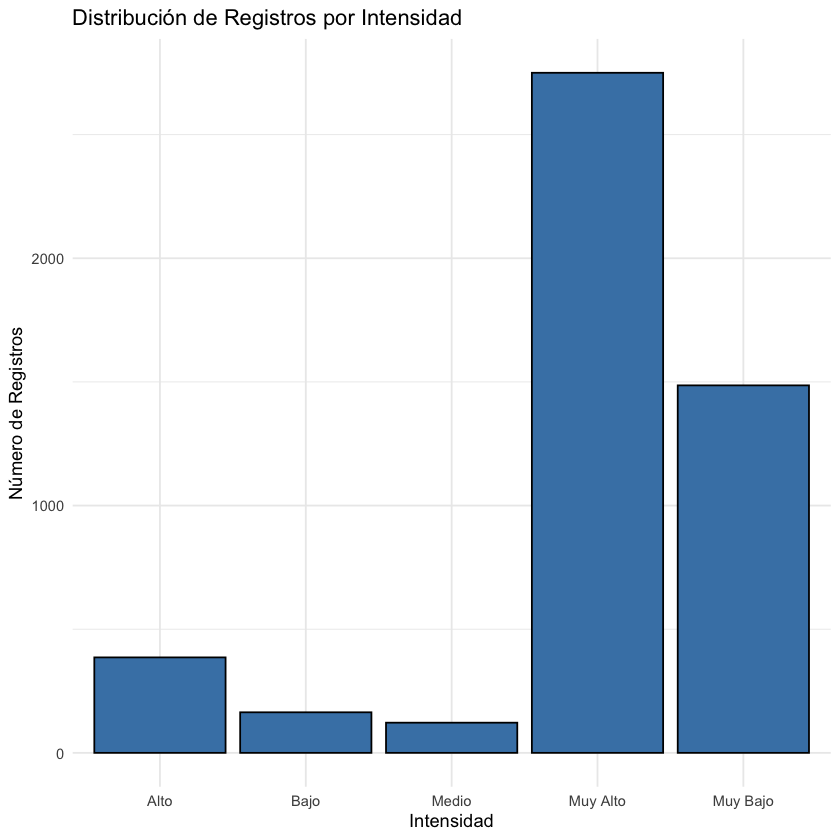

In [ ]:
library(ggplot2)

# Contar el número de registros por cada categoría en la columna `intnsdd`
df_resumen <- as.data.frame(table(df$intnsdd))
colnames(df_resumen) <- c("Intensidad", "Registros")

# Crear la gráfica de barras con el mismo color
ggplot(df_resumen, aes(x = Intensidad, y = Registros)) +
  geom_bar(stat = "identity", fill = "steelblue", color = "black") + # Color uniforme
  labs(
    title = "Distribución de Registros por Intensidad",
    x = "Intensidad",
    y = "Número de Registros"
  ) +
  theme_minimal() +
  theme(legend.position = "none") # Oculta la leyenda
